# Jobsheet 11
## Kelompok 6
### Aldin Ariel Pramudya (2141720233)
### Aryo Deva Saputra (2141720176)
### Muhammad Ega Rama Fernanda (2141720143)
Kelas : 3D

Prodi : D-IV Teknik Inormatika

Jurusan : Teknologi Inormasi

Politeknik Negeri Malang

In [2]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

## Template Matching

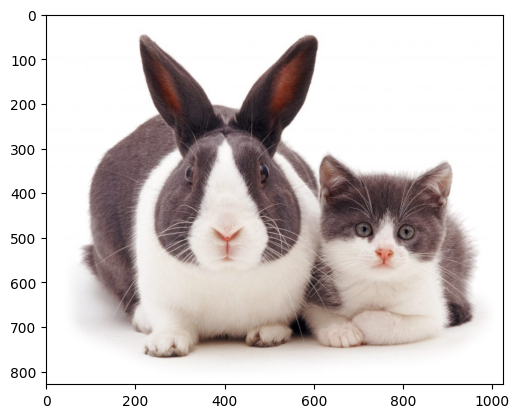

In [16]:
img = cv.imread('/content/drive/MyDrive/Semester 5 Waduh/PCVK/Jobsheet 11/Object Detection/cats_and_bunnies.jpg')
img_rgb = cv.cvtColor(input, cv.COLOR_BGR2RGB)
plt.imshow(img_rgb)

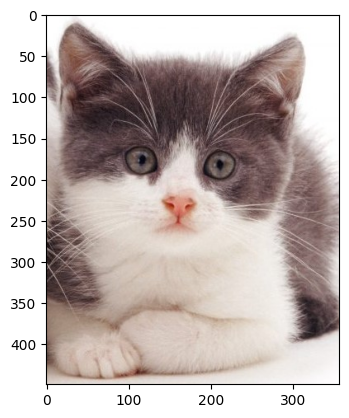

In [15]:
template = cv.imread('/content/drive/MyDrive/Semester 5 Waduh/PCVK/Jobsheet 11/Object Detection/cat2_templatejpg.jpg')
template_rgb = cv.cvtColor(template, cv.COLOR_BGR2RGB)
plt.imshow(template_rgb)

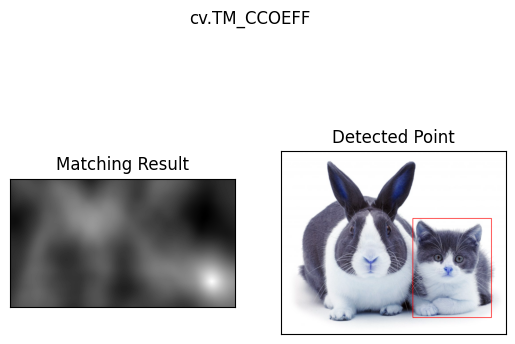

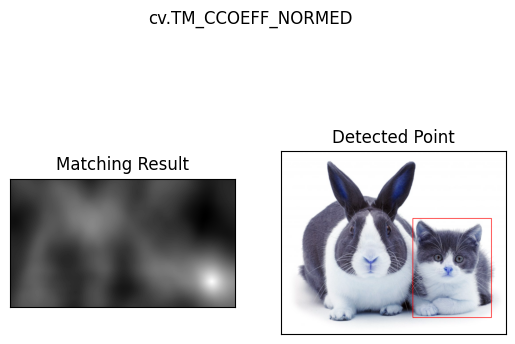

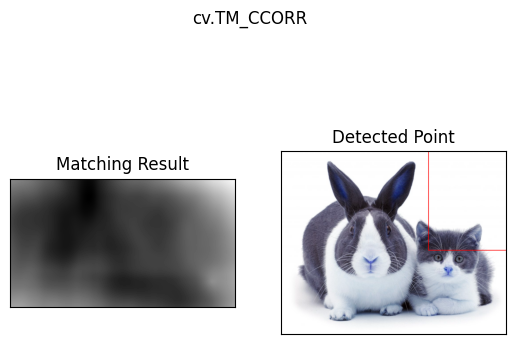

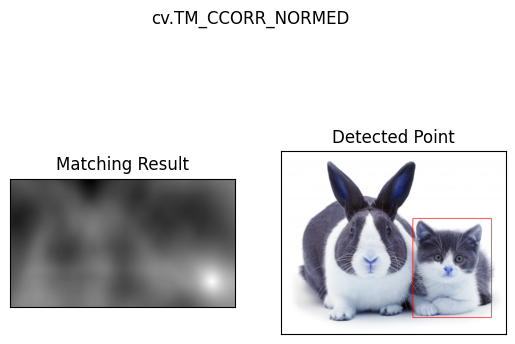

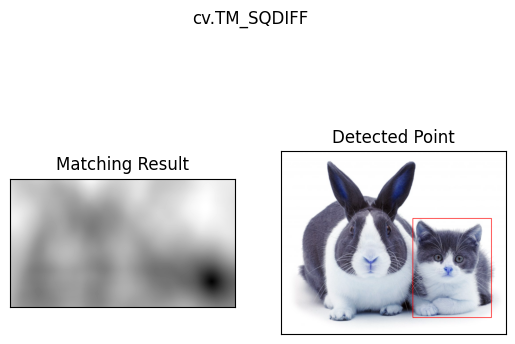

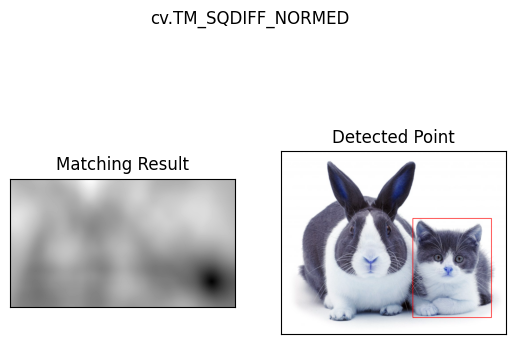

In [20]:
img = cv.imread('/content/drive/MyDrive/Semester 5 Waduh/PCVK/Jobsheet 11/Object Detection/cats_and_bunnies.jpg')
img2 = img.copy()
template = cv.imread('/content/drive/MyDrive/Semester 5 Waduh/PCVK/Jobsheet 11/Object Detection/cat2_templatejpg.jpg')
# All the 6 methods for comparison in a list
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']
for meth in methods:
    img = img2.copy()
    method = eval(meth)
    # Apply template Matching
    res = cv.matchTemplate(img,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    cv.rectangle(img,top_left, bottom_right, 255, 2)
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img,cmap = 'gray')
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle(meth)
    plt.show()

## Template Matching Tanpa Library

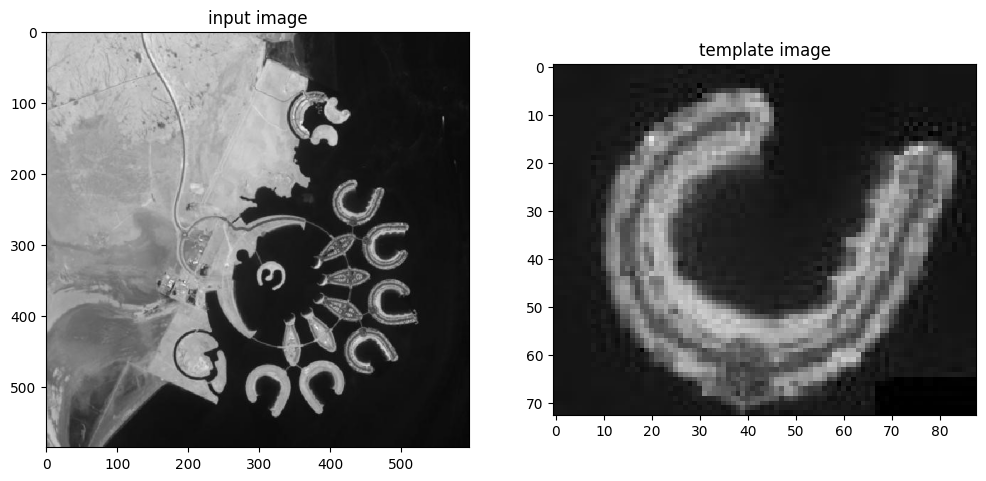

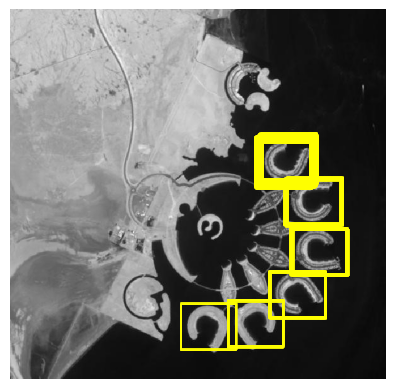

In [55]:
from skimage.feature import match_template

img = cv.imread('/content/drive/MyDrive/Semester 5 Waduh/PCVK/Jobsheet 11/Object Detection/bahrain.jpg', 0)
template = cv.imread('/content/drive/MyDrive/Semester 5 Waduh/PCVK/Jobsheet 11/Object Detection/bahrain-template.jpg', 0)

f, axarr = plt. subplots(1,2,figsize=(12,8))
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("input image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("template image")

# Hitung kemiripan citra dengan citra template
result = match_template(img, template)

# Tentukan threshold untuk menentukan hasil match
threshold = 0.45
locations = np.where(result >= threshold)

# Plot hasil match
fig, ax = plt.subplots()
ax.imshow(img, cmap=plt.cm.gray)
ax.set_axis_off()
height, width = template.shape
for loc in zip(*locations[::-1]):
    rect = plt.Rectangle(loc, width, height, edgecolor='yellow', facecolor='none', linewidth=0.5)
    ax.add_patch(rect)
plt.show()

## Implementasi Edge Detection

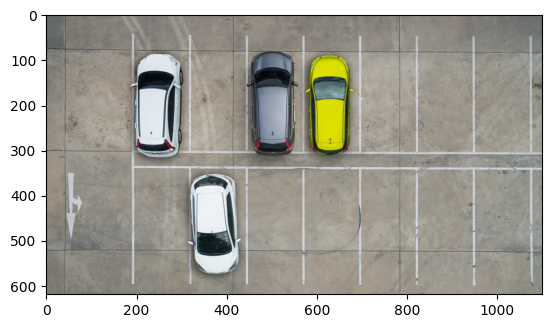

In [28]:
img_car = cv.imread('/content/drive/MyDrive/Semester 5 Waduh/PCVK/Jobsheet 11/Object Detection/car-park.jpg')
img_car_rgb = cv.cvtColor(img_car, cv.COLOR_BGR2RGB)
plt.imshow(img_car_rgb)

### Sobel Edge Detection

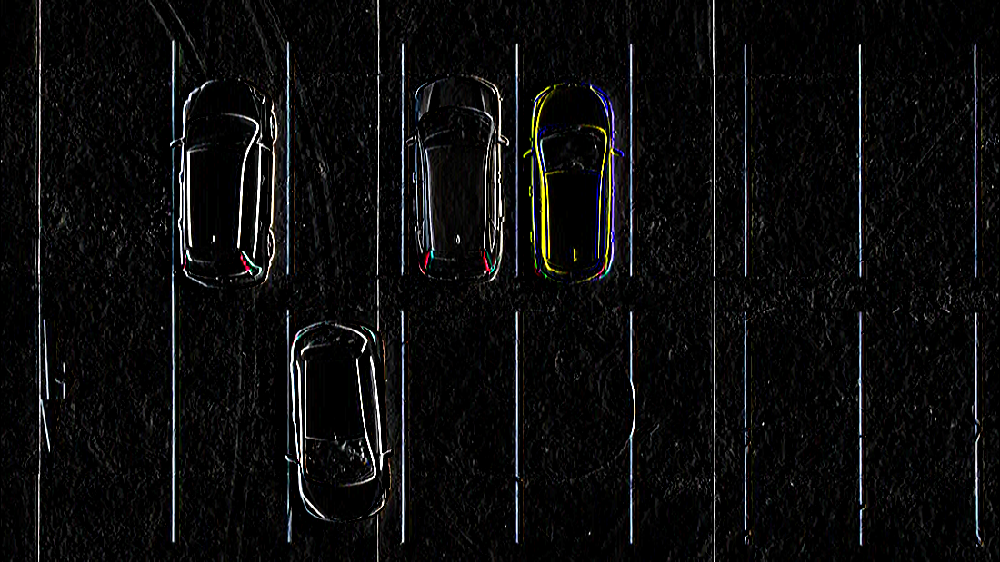

In [27]:
sobelx = cv.Sobel(img_car, cv.CV_64F, 1, 0, 5)
cv2_imshow(sobelx)

### Canny Edge Detection

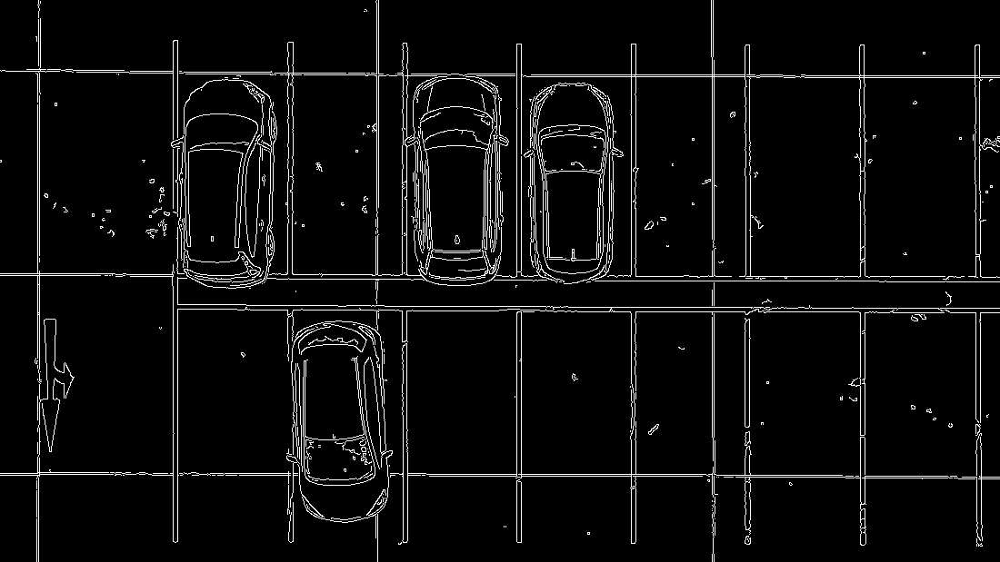

In [29]:
edges = cv.Canny(image=img_car, threshold1=100, threshold2=200)
cv2_imshow(edges)

### Laplacian Edge Detection

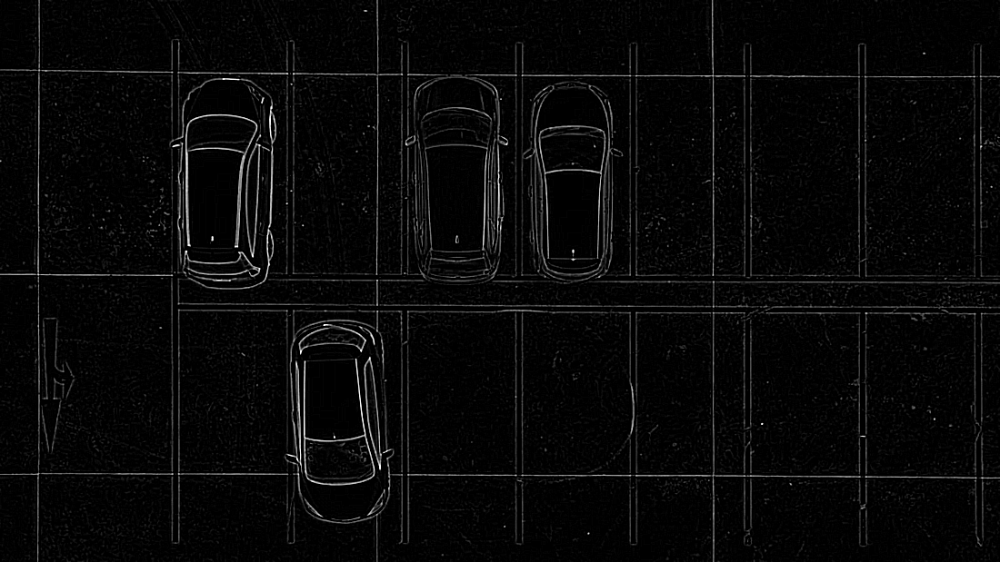

In [30]:
# remove noise
image_gray = cv.cvtColor(img_car, cv.COLOR_BGR2GRAY)
# Reduce noise in image
img = cv.GaussianBlur(image_gray,(3,3),0)
# Filter the image using filter2D, which has inputs: (grayscale image, bit-depth, kernel)
filtered_image = cv.Laplacian(img, ksize=3, ddepth=cv.CV_16S)
cv2_imshow(filtered_image)

## Implementasi Corner Detection

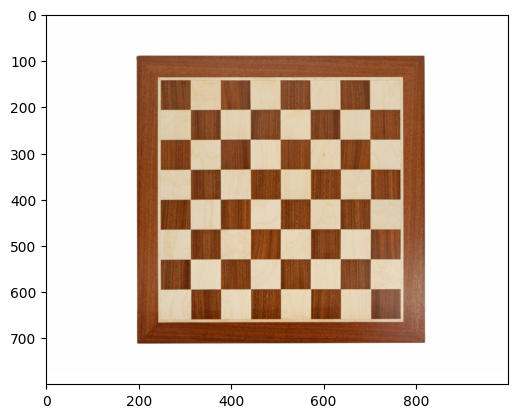

In [32]:
img_chess = cv.imread('/content/drive/MyDrive/Semester 5 Waduh/PCVK/Jobsheet 11/Object Detection/chess-board.jpg')
img_chess_rgb = cv.cvtColor(img_chess, cv.COLOR_BGR2RGB)
plt.imshow(img_chess_rgb)

### Harris Corner

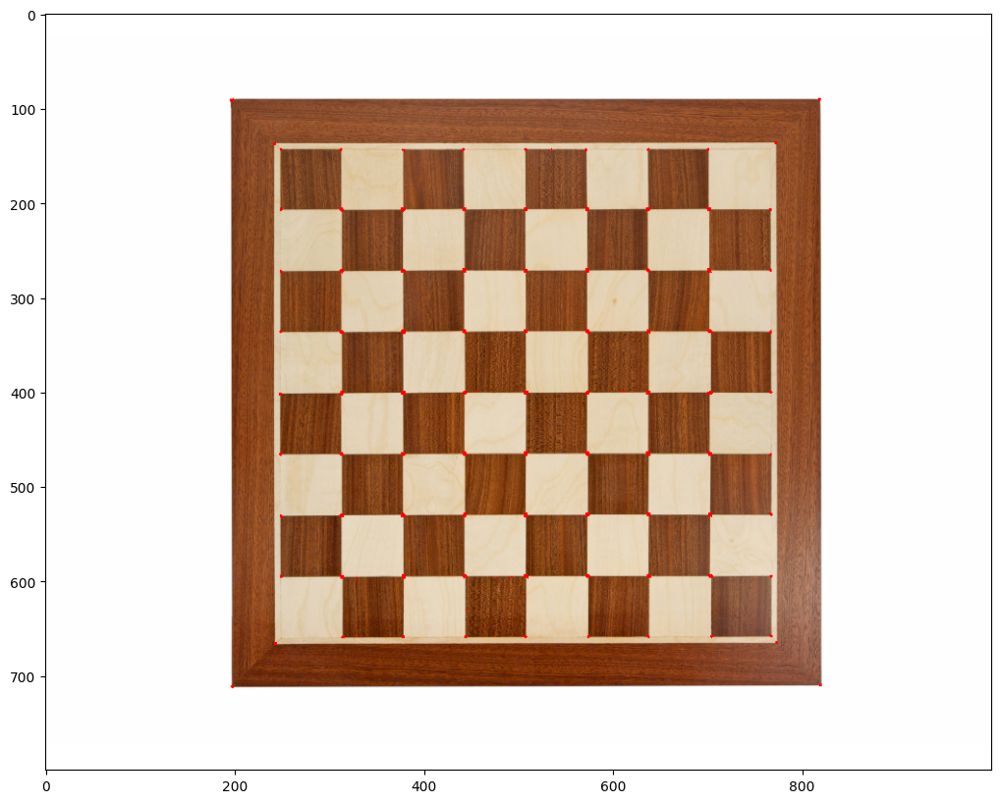

In [37]:
img_chess_gray = cv.cvtColor(img_chess, cv.COLOR_BGR2GRAY)
dst = cv.cornerHarris(img_chess_gray,3, 1, 0.04)

img_chess_gray = np.float32(img_chess_gray)
harris_output = cv.cornerHarris(img_chess_gray,2,3,3)
harris_output = cv.dilate(harris_output, None)

img_chess[dst>0.01*dst.max()]=[0,0,255]

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(img_chess, cv.COLOR_BGR2RGB))

### Shi Tomasi Detection

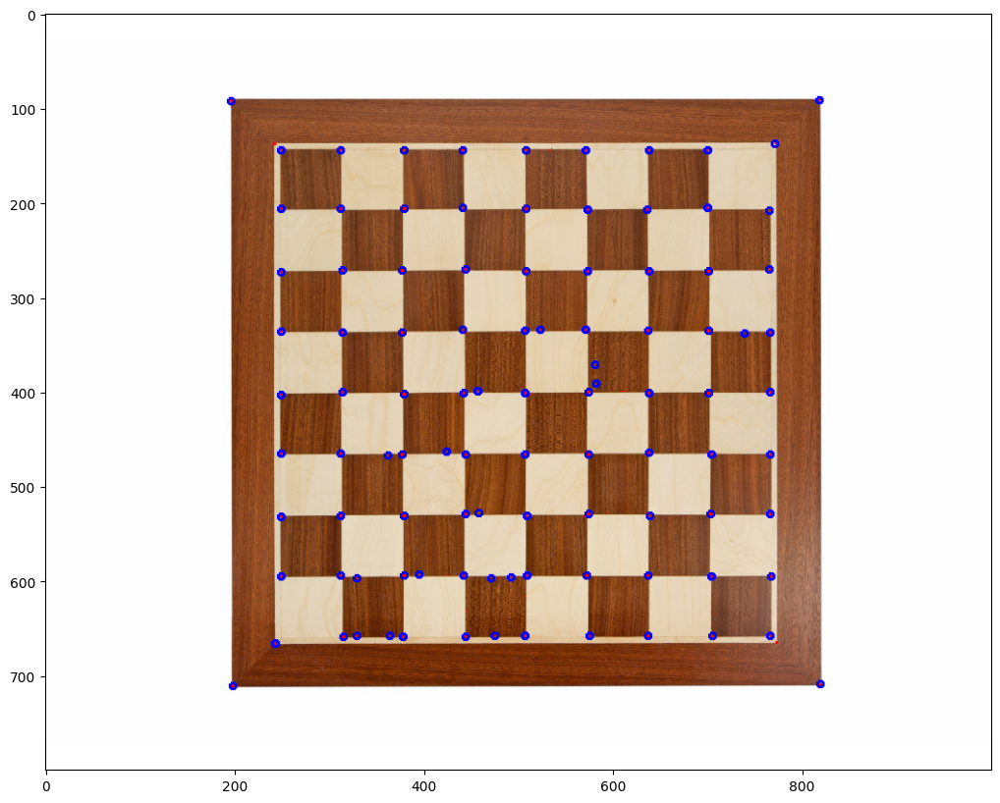

In [39]:
corners = cv.goodFeaturesToTrack(img_chess_gray, 100,0.01,10)
corners = np.int0(corners)
for i in corners:
  x,y = i.ravel()
  cv.circle(img_chess, (x,y),3,255,2)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(img_chess, cv.COLOR_BGR2RGB))

## Hough Transform

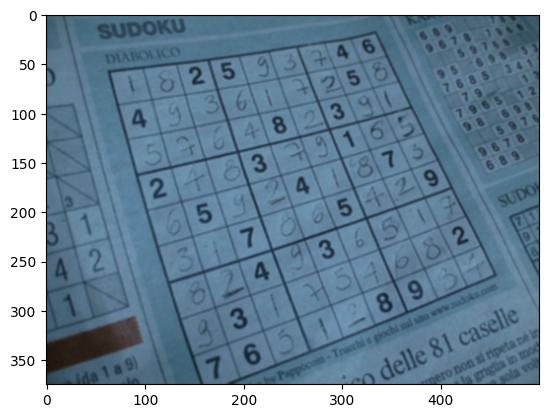

In [41]:
img_sudoku = cv.imread('/content/drive/MyDrive/Semester 5 Waduh/PCVK/Jobsheet 11/Object Detection/sudoku.jpg')
plt.imshow(img_sudoku)

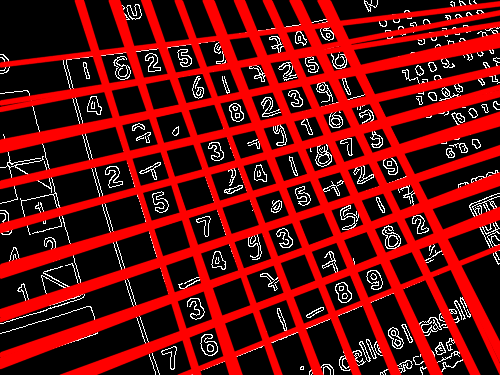

In [42]:
import sys
import math
import cv2 as cv
import numpy as np

# Edge detection
dst = cv.Canny(img_sudoku, 50, 200, None, 3)
#  Standard Hough Line Transform
lines = cv.HoughLines(dst, 1, np.pi / 180, 150, None, 0, 0)
cdst = cv.cvtColor(dst, cv.COLOR_GRAY2BGR)
# Draw the lines
if lines is not None:
    for i in range(0, len(lines)):
     rho = lines[i][0][0]
     theta = lines[i][0][1]
     a = math.cos(theta)
     b = math.sin(theta)
     x0 = a * rho
     y0 = b * rho
     pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
     pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
     cv.line(cdst, pt1, pt2, (0,0,255), 3, cv.LINE_AA)

cv2_imshow(cdst)

## Find Contours

In [47]:
img_laptops = cv.imread('/content/drive/MyDrive/Semester 5 Waduh/PCVK/Jobsheet 11/Object Detection/laptop.jpg')
gray = cv.cvtColor(img_laptops, cv.COLOR_BGR2GRAY)

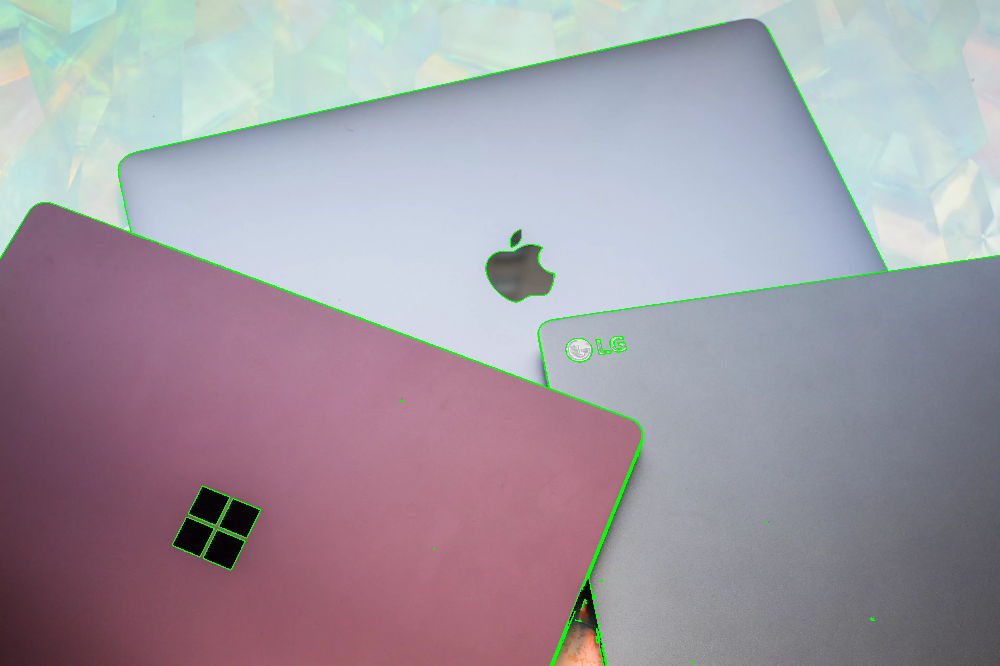

In [48]:
edged = cv.Canny(gray, 30, 200)
contours, hierarchy = cv.findContours(edged, cv.RETR_EXTERNAL,cv.CHAIN_APPROX_NONE)
cv.drawContours(img_laptops, contours, -1, (0, 255, 0), 3)
cv2_imshow(img_laptops)

## Tugas Pratikum
#### Kelompok 6 : KTP Abdurrauf Soppeng

In [49]:
import cv2
import os

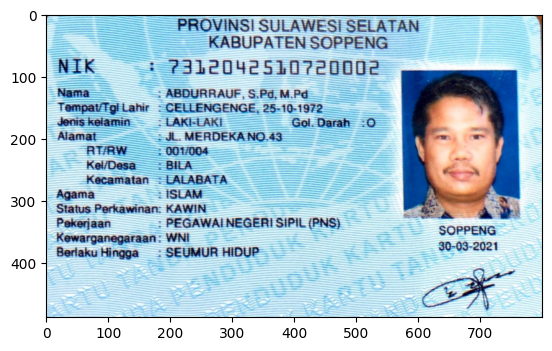

In [64]:
img_ktp = cv.imread('/content/drive/MyDrive/Semester 5 Waduh/PCVK/Jobsheet 7/KTP_More/KTP7.jpeg')
img_ktp_rgb = cv.cvtColor(img_ktp, cv.COLOR_BGR2RGB)
plt.imshow(img_ktp_rgb)

140.0 (488, 800)


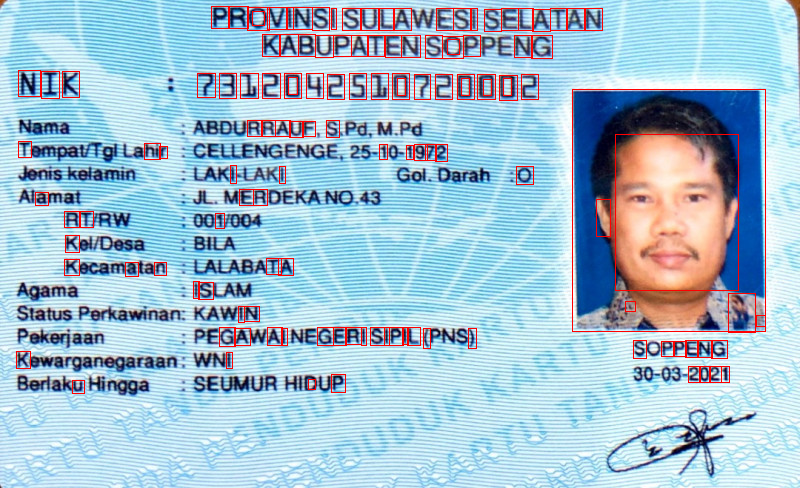

In [65]:
# Ubah ke grayscale
gray = cv2.cvtColor(img_ktp, cv2.COLOR_BGR2GRAY)

ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(ret, bw.shape)

erode = cv.erode(bw.copy(), cv.getStructuringElement(cv.MORPH_OPEN, (1, 1)))

# Ekstraksi kontur
contours, hierarchy = cv.findContours(erode.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)
# Looping contours untuk mendapatkan kontur yang sesuai
for cnt in contours:
    x, y, w, h = cv.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
      cv.rectangle(img_ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 10 and w >= 5 and float(ras) <= 1:
      cv.rectangle(img_ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 10 and w >= 5 and float(ras) <= 1:
      cv.rectangle(img_ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

cv2_imshow(img_ktp)